# Necessary Functions

In [1]:
!pip install -q kaggle

In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"hoithngung","key":"913d64092b3cae0ed3dd2eede1d7d45a"}'}

In [3]:
!mkdir ~/.kaggle

In [4]:
!cp kaggle.json ~/.kaggle/

In [5]:
!kaggle datasets download -d laithjj/diabetic-foot-ulcer-dfu

Dataset URL: https://www.kaggle.com/datasets/laithjj/diabetic-foot-ulcer-dfu
License(s): unknown
 94% 121M/129M [00:00<00:00, 175MB/s]
100% 129M/129M [00:00<00:00, 154MB/s]


In [6]:
!unzip /content/diabetic-foot-ulcer-dfu.zip

Archive:  /content/diabetic-foot-ulcer-dfu.zip
  inflating: DFU/Original Images/1.jpg  
  inflating: DFU/Original Images/1.png  
  inflating: DFU/Original Images/10.jpg  
  inflating: DFU/Original Images/1054877509612379438.jpg  
  inflating: DFU/Original Images/1076771990506636278.jpg  
  inflating: DFU/Original Images/11.jpg  
  inflating: DFU/Original Images/12.jpg  
  inflating: DFU/Original Images/13.jpg  
  inflating: DFU/Original Images/14.jpg  
  inflating: DFU/Original Images/1430965400006561945.jpg  
  inflating: DFU/Original Images/15.jpg  
  inflating: DFU/Original Images/16.jpg  
  inflating: DFU/Original Images/17.JPG  
  inflating: DFU/Original Images/18.jpg  
  inflating: DFU/Original Images/19.jpg  
  inflating: DFU/Original Images/2 (2).jpg  
  inflating: DFU/Original Images/2.jpg  
  inflating: DFU/Original Images/2.png  
  inflating: DFU/Original Images/20.jpg  
  inflating: DFU/Original Images/21.jpg  
  inflating: DFU/Original Images/2100472819858240689.jpg  
  in

In [7]:
import warnings
warnings.filterwarnings("ignore")
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model, load_model, Sequential
import numpy as np
import pandas as pd
import shutil
import time
import cv2 as cv2
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import os
import seaborn as sns
sns.set_style('darkgrid')
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
from IPython.core.display import display, HTML
# stop annoying tensorflow warning messages
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

# Functions

In [8]:
def show_image_samples(gen ):
    t_dict=gen.class_indices
    classes=list(t_dict.keys())
    images,labels=next(gen) # get a sample batch from the generator
    plt.figure(figsize=(20, 20))
    length=len(labels)
    if length<25:   #show maximum of 25 images
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5, 5, i + 1)
        image=images[i]/255
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color='blue', fontsize=12)
        plt.axis('off')
    plt.show()

In [9]:
def show_images(tdir):
    classlist=os.listdir(tdir)
    length=len(classlist)
    columns=5
    rows=int(np.ceil(length/columns))
    plt.figure(figsize=(20, rows * 4))
    for i, klass in enumerate(classlist):
        classpath=os.path.join(tdir, klass)
        imgpath=os.path.join(classpath, '1.jpg')
        img=plt.imread(imgpath)
        plt.subplot(rows, columns, i+1)
        plt.axis('off')
        plt.title(klass, color='blue', fontsize=12)
        plt.imshow(img)

In [10]:
# for RGB foreground and background
def print_in_color(txt_msg,fore_tupple,back_tupple,):
    #prints the text_msg in the foreground color specified by fore_tupple with the background specified by back_tupple
    #text_msg is the text, fore_tupple is foregroud color tupple (r,g,b), back_tupple is background tupple (r,g,b)
    rf,gf,bf=fore_tupple
    rb,gb,bb=back_tupple
    msg='{0}' + txt_msg
    mat='\33[38;2;' + str(rf) +';' + str(gf) + ';' + str(bf) + ';48;2;' + str(rb) + ';' +str(gb) + ';' + str(bb) +'m'
    print(msg .format(mat), flush=True)
    print('\33[0m', flush=True) # returns default print color to back to black
    return

In [11]:
# Define a function to plot the training data
def tr_plot(tr_data, start_epoch):
    #Plot the training and validation data
    tacc=tr_data.history['accuracy']
    tloss=tr_data.history['loss']
    vacc=tr_data.history['val_accuracy']
    vloss=tr_data.history['val_loss']
    Epoch_count=len(tacc)+ start_epoch
    Epochs=[]
    for i in range (start_epoch ,Epoch_count):
        Epochs.append(i+1)
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1 +start_epoch)
    vc_label='best epoch= '+ str(index_acc + 1+ start_epoch)
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(Epochs,tloss, 'r', label='Training loss')
    axes[0].plot(Epochs,vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1 +start_epoch,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (Epochs,tacc,'r',label= 'Training Accuracy')
    axes[1].plot (Epochs,vacc,'g',label= 'Validation Accuracy')
    axes[1].scatter(index_acc+1 +start_epoch,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout
    #plt.style.use('fivethirtyeight')
    plt.show()

In [12]:
# define a function to create confusion matrix and classification report
def print_info( test_gen, preds, print_code, save_dir, subject ):
    class_dict=test_gen.class_indices
    labels= test_gen.labels
    file_names= test_gen.filenames
    error_list=[]
    true_class=[]
    pred_class=[]
    prob_list=[]
    new_dict={}
    error_indices=[]
    y_pred=[]
    for key,value in class_dict.items():
        new_dict[value]=key             # dictionary {integer of class number: string of class name}
    # store new_dict as a text fine in the save_dir
    classes=list(new_dict.values())     # list of string of class names
    errors=0
    for i, p in enumerate(preds):
        pred_index=np.argmax(p)
        true_index=labels[i]  # labels are integer values
        if pred_index != true_index: # a misclassification has occurred
            error_list.append(file_names[i])
            true_class.append(new_dict[true_index])
            pred_class.append(new_dict[pred_index])
            prob_list.append(p[pred_index])
            error_indices.append(true_index)
            errors=errors + 1
        y_pred.append(pred_index)
    if print_code !=0:
        if errors>0:
            if print_code>errors:
                r=errors
            else:
                r=print_code
            msg='{0:^28s}{1:^28s}{2:^28s}{3:^16s}'.format('Filename', 'Predicted Class' , 'True Class', 'Probability')
            print_in_color(msg, (0,255,0),(55,65,80))
            for i in range(r):
                split1=os.path.split(error_list[i])
                split2=os.path.split(split1[0])
                fname=split2[1] + '/' + split1[1]
                msg='{0:^28s}{1:^28s}{2:^28s}{3:4s}{4:^6.4f}'.format(fname, pred_class[i],true_class[i], ' ', prob_list[i])
                print_in_color(msg, (255,255,255), (55,65,60))
                #print(error_list[i]  , pred_class[i], true_class[i], prob_list[i])
        else:
            msg='With accuracy of 100 % there are no errors to print'
            print_in_color(msg, (0,255,0),(55,65,80))
    if errors>0:
        plot_bar=[]
        plot_class=[]
        for  key, value in new_dict.items():
            count=error_indices.count(key)
            if count!=0:
                plot_bar.append(count) # list containg how many times a class c had an error
                plot_class.append(value)   # stores the class
        fig=plt.figure()
        fig.set_figheight(len(plot_class)/3)
        fig.set_figwidth(10)
        plt.style.use('fivethirtyeight')
        for i in range(0, len(plot_class)):
            c=plot_class[i]
            x=plot_bar[i]
            plt.barh(c, x, )
            plt.title( ' Errors by Class on Test Set')
    y_true= np.array(labels)
    y_pred=np.array(y_pred)
    if len(classes)<= 30:
        # create a confusion matrix
        cm = confusion_matrix(y_true, y_pred )
        length=len(classes)
        if length<8:
            fig_width=8
            fig_height=8
        else:
            fig_width= int(length * .5)
            fig_height= int(length * .5)
        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
        plt.xticks(np.arange(length)+.5, classes, rotation= 90)
        plt.yticks(np.arange(length)+.5, classes, rotation=0)
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title("Confusion Matrix")
        plt.show()
    clr = classification_report(y_true, y_pred, target_names=classes)
    print("Classification Report:\n----------------------\n", clr)


In [13]:
# define a function to save the model and the associated class_dict.csv file
def saver(save_path, model, model_name, subject, accuracy,img_size, scalar, generator):
    # first save the model
    save_id=str (model_name +  '-' + subject +'-'+ str(acc)[:str(acc).rfind('.')+3] + '.h5')
    model_save_loc=os.path.join(save_path, save_id)
    model.save(model_save_loc)
    print_in_color ('model was saved as ' + model_save_loc, (0,255,0),(55,65,80))
    # now create the class_df and convert to csv file
    class_dict=generator.class_indices
    height=[]
    width=[]
    scale=[]
    for i in range(len(class_dict)):
        height.append(img_size[0])
        width.append(img_size[1])
        scale.append(scalar)
    Index_series=pd.Series(list(class_dict.values()), name='class_index')
    Class_series=pd.Series(list(class_dict.keys()), name='class')
    Height_series=pd.Series(height, name='height')
    Width_series=pd.Series(width, name='width')
    Scale_series=pd.Series(scale, name='scale by')
    class_df=pd.concat([Index_series, Class_series, Height_series, Width_series, Scale_series], axis=1)
    csv_name='class_dict.csv'
    csv_save_loc=os.path.join(save_path, csv_name)
    class_df.to_csv(csv_save_loc, index=False)
    print_in_color ('class csv file was saved as ' + csv_save_loc, (0,255,0),(55,65,80))
    return model_save_loc, csv_save_loc

In [14]:
# define a function that uses the trained model and the class_dict.csv file to predict images
def predictor(sdir, csv_path,  model_path, crop_image = False):
    # read in the csv file
    class_df=pd.read_csv(csv_path)
    img_height=int(class_df['height'].iloc[0])
    img_width =int(class_df['width'].iloc[0])
    img_size=(img_width, img_height)
    scale=class_df['scale by'].iloc[0]
    try:
        s=int(scale)
        s2=1
        s1=0
    except:
        split=scale.split('-')
        s1=float(split[1])
        s2=float(split[0].split('*')[1])
        print (s1,s2)
    path_list=[]
    paths=os.listdir(sdir)
    for f in paths:
        path_list.append(os.path.join(sdir,f))
    print (' Model is being loaded- this will take about 10 seconds')
    model=load_model(model_path)
    image_count=len(path_list)
    index_list=[]
    prob_list=[]
    cropped_image_list=[]
    good_image_count=0
    for i in range (image_count):
        img=cv2.imread(path_list[i])
        if crop_image == True:
            status, img=crop(img)
        else:
            status=True
        if status== True:
            good_image_count +=1
            img=cv2.resize(img, img_size)
            cropped_image_list.append(img)
            img=img*s2 - s1
            img=np.expand_dims(img, axis=0)
            p= np.squeeze (model.predict(img))
            index=np.argmax(p)
            prob=p[index]
            index_list.append(index)
            prob_list.append(prob)
    if good_image_count==1:
        class_name= class_df['class'].iloc[index_list[0]]
        probability= prob_list[0]
        img=cropped_image_list [0]
        plt.title(class_name, color='blue', fontsize=16)
        plt.axis('off')
        plt.imshow(img)
        return class_name, probability
    elif good_image_count == 0:
        return None, None
    most=0
    for i in range (len(index_list)-1):
        key= index_list[i]
        keycount=0
        for j in range (i+1, len(index_list)):
            nkey= index_list[j]
            if nkey == key:
                keycount +=1
        if keycount> most:
            most=keycount
            isave=i
    best_index=index_list[isave]
    psum=0
    bestsum=0
    for i in range (len(index_list)):
        psum += prob_list[i]
        if index_list[i]==best_index:
            bestsum += prob_list[i]
    img= cropped_image_list[isave]/255
    class_name=class_df['class'].iloc[best_index]
    plt.title(class_name, color='blue', fontsize=16)
    plt.axis('off')
    plt.imshow(img)
    return class_name, bestsum/image_count

In [15]:
# Define a function that takes in a dataframe `df`, an integer `max_size`, an integer `min_size`, and a string `column`.
# This function returns a new dataframe where the number of samples for any class specified by `column`
# is limited to a maximum (`max_size`) and is above or equal to a minimum (`min_size`).

def trim(df, max_size, min_size, column):
    # Create a copy of the input dataframe to avoid modifying the original
    df = df.copy()

    # Initialize an empty list to store the resampled data
    sample_list = []

    # Group the dataframe by the specified column (class labels)
    groups = df.groupby(column)

    # Iterate over each unique label in the column
    for label in df[column].unique():
        # Get the group (subset) of data corresponding to the current label
        group = groups.get_group(label)

        # Get the number of samples in the current group
        sample_count = len(group)

        # If the number of samples exceeds the maximum size (`max_size`)
        if sample_count > max_size:
            # Randomly sample `max_size` samples from the group without replacement
            samples = group.sample(max_size, replace=False, weights=None, random_state=123, axis=0).reset_index(drop=True)
            # Add the sampled group to the sample list
            sample_list.append(samples)
        # If the number of samples is between `min_size` and `max_size`
        elif sample_count >= min_size:
            # Add the entire group to the sample list
            sample_list.append(group)

    # Combine all the sampled groups into a single dataframe
    df = pd.concat(sample_list, axis=0).reset_index(drop=True)

    # Calculate the distribution of samples in each class and print it
    balance = list(df[column].value_counts())
    print(balance)

    # Return the resampled dataframe
    return df

(2659, 1265, 3)


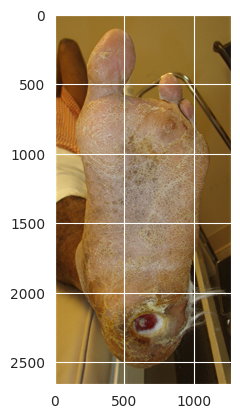

In [16]:
fpath=r'/content/DFU/Original Images/14.jpg'
img=plt.imread(fpath)
print (img.shape)
imshow(img)

In [17]:
import os

# Paths to the directories
abnormal_path = '/content/DFU/Patches/Abnormal(Ulcer)'
normal_path = '/content/DFU/Patches/Normal(Healthy skin)'

# Function to count image files in a directory
def count_images(folder_path):
    if os.path.exists(folder_path):
        return len([f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    else:
        return 0  # Return 0 if the folder does not exist

# Count images in each directory
abnormal_count = count_images(abnormal_path)
normal_count = count_images(normal_path)

# Print the results
print(f"Number of images in Abnormal(Ulcer): {abnormal_count}")
print(f"Number of images in Normal(Healthy skin): {normal_count}")


Number of images in Abnormal(Ulcer): 512
Number of images in Normal(Healthy skin): 543


In [18]:
# define function to preprocess the dataframe
def preprocess (sdir, trsplit, vsplit):
    filepaths=[]
    labels=[]
    classlist=os.listdir(sdir)
    for klass in classlist:
        classpath=os.path.join(sdir,klass)
        flist=os.listdir(classpath)
        for f in flist:
            fpath=os.path.join(classpath,f)
            filepaths.append(fpath)
            labels.append(klass)
    Fseries=pd.Series(filepaths, name='filepaths')
    Lseries=pd.Series(labels, name='labels')
    df=pd.concat([Fseries, Lseries], axis=1)
    # split df into train_df and test_df
    dsplit=vsplit/(1-trsplit)
    strat=df['labels']
    train_df, dummy_df=train_test_split(df, train_size=trsplit, shuffle=True, random_state=123, stratify=strat)
    strat=dummy_df['labels']
    valid_df, test_df=train_test_split(dummy_df, train_size=dsplit, shuffle=True, random_state=123, stratify=strat)
    print('train_df length: ', len(train_df), '  test_df length: ',len(test_df), '  valid_df length: ', len(valid_df))
    print(train_df['labels'].value_counts())
    return train_df, test_df, valid_df

# Patches Input

**Split the Dataset**

In [19]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

# Define dataset paths
data_dir = "/content/DFU/Patches"
destination_dir = "/content/DFU/SplitData"

# Create necessary directories
os.makedirs(destination_dir, exist_ok=True)
for dataset_type in ['train', 'valid', 'test']:
    os.makedirs(os.path.join(destination_dir, dataset_type), exist_ok=True)

def preprocess(data_dir, train_ratio=0.6, val_ratio=0.2, test_ratio=0.2):
    all_images = []
    classes = os.listdir(data_dir)

    for class_name in classes:
        class_path = os.path.join(data_dir, class_name)
        if os.path.isdir(class_path):
            images = [(class_name, img) for img in os.listdir(class_path)]
            all_images.extend(images)

    df = pd.DataFrame(all_images, columns=['class', 'filename'])

    # Fix floating-point precision issue
    assert round(train_ratio + val_ratio + test_ratio, 5) == 1.0, "Ratios must sum to 1!"

    # Split dataset: Train (60%) and Temp (40%)
    train_df, temp_df = train_test_split(df, test_size=(1 - train_ratio), stratify=df['class'], random_state=42)

    # Split temp into Validation (20%) and Test (20%)
    valid_df, test_df = train_test_split(temp_df, test_size=(test_ratio / (val_ratio + test_ratio)),
                                         stratify=temp_df['class'], random_state=42)

    return train_df, valid_df, test_df

# Split the dataset
train_df, valid_df, test_df = preprocess(data_dir, 0.6, 0.2, 0.2)

# Display dataset sizes
print(f"Train set size: {len(train_df)}")
print(f"Validation set size: {len(valid_df)}")
print(f"Test set size: {len(test_df)}")

Train set size: 633
Validation set size: 211
Test set size: 211


**Copy Images to Train, Validation, and Test Folders**

In [20]:
def copy_images(df, src_dir, dst_dir):
    for _, row in df.iterrows():
        class_name, filename = row['class'], row['filename']
        src_path = os.path.join(src_dir, class_name, filename)
        dst_class_dir = os.path.join(dst_dir, class_name)
        os.makedirs(dst_class_dir, exist_ok=True)
        dst_path = os.path.join(dst_class_dir, filename)
        if not os.path.exists(dst_path):
            shutil.copy(src_path, dst_path)

# Copy images into respective directories
copy_images(train_df, data_dir, os.path.join(destination_dir, "train"))
copy_images(valid_df, data_dir, os.path.join(destination_dir, "valid"))
copy_images(test_df, data_dir, os.path.join(destination_dir, "test"))

print("Data successfully copied to Train, Validation, and Test folders.")

Data successfully copied to Train, Validation, and Test folders.


**Perform Augmentation on Training Data**

In [21]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from PIL import Image, ImageEnhance

# Define paths
train_dir = "/content/DFU/SplitData/train"
augmented_dir = "/content/DFU/AugmentedData"

# Create augmented data directory
os.makedirs(augmented_dir, exist_ok=True)

# Define augmentation parameters
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
MAX_IMAGES_PER_CLASS = 5000  # Giới hạn số lượng ảnh tối đa mỗi lớp

# Function to resize image with padding
def resize_with_padding(image, target_size):
    old_size = image.size
    ratio = min(target_size[0] / old_size[0], target_size[1] / old_size[1])
    new_size = (int(old_size[0] * ratio), int(old_size[1] * ratio))
    image = image.resize(new_size, Image.LANCZOS)

    new_image = Image.new("RGB", target_size, (255, 255, 255))
    new_image.paste(image, ((target_size[0] - new_size[0]) // 2,
                            (target_size[1] - new_size[1]) // 2))
    return new_image

# Function to add Gaussian noise (low intensity)
def add_gaussian_noise(image):
    if len(image.shape) == 3:
        noise = np.random.normal(0, 1.5, image.shape)
        noisy_image = np.clip(image + noise, 0, 255).astype(np.uint8)
        return noisy_image
    return image

# Function to apply random crop
def random_crop(image, crop_size):
    width, height = image.size
    crop_width, crop_height = crop_size
    left = np.random.randint(0, width - crop_width + 1)
    top = np.random.randint(0, height - crop_height + 1)
    return image.crop((left, top, left + crop_width, top + crop_height))

# Function to randomly adjust color
def random_color_transform(image):
    enhancer = ImageEnhance.Color(image)
    factor = np.random.uniform(0.95, 1.05)
    return enhancer.enhance(factor)

def augment_training_data():
    for folder in os.listdir(train_dir):
        folder_path = os.path.join(train_dir, folder)
        save_folder = os.path.join(augmented_dir, folder)
        os.makedirs(save_folder, exist_ok=True)

        train_images = os.listdir(folder_path)
        all_images = []

        for filename in train_images:
            img_path = os.path.join(folder_path, filename)
            img = load_img(img_path)
            img = resize_with_padding(img, (IMAGE_WIDTH, IMAGE_HEIGHT))
            all_images.append(img_to_array(img))

        all_images = np.array(all_images)
        augment_needed = MAX_IMAGES_PER_CLASS - len(train_images)
        start_number = len(train_images) + 1

        if augment_needed <= 0:
            print(f"Skipping {folder}, already has {len(train_images)} images.")
            continue

        # Define augmentation transformations
        datagen = ImageDataGenerator(
            rotation_range=10,
            brightness_range=[0.9, 1.1],
            horizontal_flip=True,
            zoom_range=[0.9, 1.1],
            width_shift_range=0.1,
            height_shift_range=0.1
        )

        for batch in datagen.flow(all_images, batch_size=1):
            augmented_image = batch[0].astype(np.uint8)

            # Add Gaussian noise to 10% of images
            if np.random.rand() < 0.1:
                augmented_image = add_gaussian_noise(augmented_image)

            # Apply random crop to 20% of images
            if np.random.rand() < 0.2:
                img_pil = Image.fromarray(augmented_image)
                cropped = random_crop(img_pil, (200, 200))
                augmented_image = np.array(resize_with_padding(cropped, (IMAGE_WIDTH, IMAGE_HEIGHT)))

            # Adjust color for 10% of images
            if np.random.rand() < 0.1:
                img_pil = Image.fromarray(augmented_image)
                augmented_image = np.array(random_color_transform(img_pil))

            # Resize back to target size after transformations
            img_pil = Image.fromarray(augmented_image)
            img_resized = resize_with_padding(img_pil, (IMAGE_WIDTH, IMAGE_HEIGHT))

            # Save the augmented image
            unique_filename = f"{start_number}.jpg"
            img_resized.save(os.path.join(save_folder, unique_filename))

            augment_needed -= 1
            start_number += 1
            if augment_needed <= 0:
                break

        print(f"Completed augmentation for {folder}. Total images: {MAX_IMAGES_PER_CLASS}")

# Execute augmentation
augment_training_data()

print("Augmentation completed successfully.")

Completed augmentation for Normal(Healthy skin). Total images: 5000
Completed augmentation for Abnormal(Ulcer). Total images: 5000
Augmentation completed successfully.


**Merge Original and Augmented Training Data**

In [22]:
import glob

# Define paths
train_original_dir = "/content/DFU/SplitData/train"
augmented_dir = "/content/DFU/AugmentedData"

# Retrieve original training images
original_paths = glob.glob(f"{train_original_dir}/*/*.jpg")
original_df = pd.DataFrame({'filepaths': original_paths})
original_df['class'] = original_df['filepaths'].apply(lambda x: os.path.basename(os.path.dirname(x)))

# Retrieve augmented images
augmented_paths = glob.glob(f"{augmented_dir}/*/*.jpg")
augmented_df = pd.DataFrame({'filepaths': augmented_paths})
augmented_df['class'] = augmented_df['filepaths'].apply(lambda x: os.path.basename(os.path.dirname(x)))

# Merge original and augmented images
train_df = pd.concat([original_df, augmented_df], ignore_index=True)

# Print dataset sizes
print(f"Final training set size after augmentation: {len(train_df)}")
print(f"Sample of training data:\n{train_df.head()}")

Final training set size after augmentation: 10000
Sample of training data:
                                           filepaths                 class
0  /content/DFU/SplitData/train/Normal(Healthy sk...  Normal(Healthy skin)
1  /content/DFU/SplitData/train/Normal(Healthy sk...  Normal(Healthy skin)
2  /content/DFU/SplitData/train/Normal(Healthy sk...  Normal(Healthy skin)
3  /content/DFU/SplitData/train/Normal(Healthy sk...  Normal(Healthy skin)
4  /content/DFU/SplitData/train/Normal(Healthy sk...  Normal(Healthy skin)


In [23]:
# Rename 'filename' to 'filepaths' in valid_df and test_df
valid_df.rename(columns={"filename": "filepaths"}, inplace=True)
test_df.rename(columns={"filename": "filepaths"}, inplace=True)

# Verify the columns after renaming
print("Updated Validation columns:", valid_df.columns)
print("Updated Test columns:", test_df.columns)


Updated Validation columns: Index(['class', 'filepaths'], dtype='object')
Updated Test columns: Index(['class', 'filepaths'], dtype='object')


**Convert Filenames to Full Paths**

In [24]:
import os

# Define the base directories
valid_base_dir = "/content/DFU/SplitData/valid"
test_base_dir = "/content/DFU/SplitData/test"

# Convert filenames to full paths
valid_df["filepaths"] = valid_df.apply(lambda row: os.path.join(valid_base_dir, row["class"], row["filepaths"]), axis=1)
test_df["filepaths"] = test_df.apply(lambda row: os.path.join(test_base_dir, row["class"], row["filepaths"]), axis=1)

# Convert all paths to strings
valid_df["filepaths"] = valid_df["filepaths"].astype(str)
test_df["filepaths"] = test_df["filepaths"].astype(str)

# Verify changes
print(valid_df.head())
print(test_df.head())

                    class                                          filepaths
784       Abnormal(Ulcer)  /content/DFU/SplitData/valid/Abnormal(Ulcer)/3...
578       Abnormal(Ulcer)  /content/DFU/SplitData/valid/Abnormal(Ulcer)/3...
163  Normal(Healthy skin)  /content/DFU/SplitData/valid/Normal(Healthy sk...
421  Normal(Healthy skin)  /content/DFU/SplitData/valid/Normal(Healthy sk...
965       Abnormal(Ulcer)  /content/DFU/SplitData/valid/Abnormal(Ulcer)/3...
                    class                                          filepaths
8    Normal(Healthy skin)  /content/DFU/SplitData/test/Normal(Healthy ski...
677       Abnormal(Ulcer)  /content/DFU/SplitData/test/Abnormal(Ulcer)/22...
605       Abnormal(Ulcer)  /content/DFU/SplitData/test/Abnormal(Ulcer)/12...
909       Abnormal(Ulcer)  /content/DFU/SplitData/test/Abnormal(Ulcer)/84...
228  Normal(Healthy skin)  /content/DFU/SplitData/test/Normal(Healthy ski...


In [25]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 30
test_batch_size = 4

train_gen = ImageDataGenerator(preprocessing_function=None).flow_from_dataframe(
    train_df, x_col="filepaths", y_col="class", target_size=(224, 224), class_mode="categorical",
    color_mode="rgb", shuffle=True, batch_size=batch_size
)

valid_gen = ImageDataGenerator(preprocessing_function=None).flow_from_dataframe(
    valid_df, x_col="filepaths", y_col="class", target_size=(224, 224), class_mode="categorical",
    color_mode="rgb", shuffle=True, batch_size=batch_size
)

test_gen = ImageDataGenerator(preprocessing_function=None).flow_from_dataframe(
    test_df, x_col="filepaths", y_col="class", target_size=(224, 224), class_mode="categorical",
    color_mode="rgb", shuffle=False, batch_size=test_batch_size
)

print("Data generators initialized successfully.")

Found 10000 validated image filenames belonging to 2 classes.
Found 211 validated image filenames belonging to 2 classes.
Found 211 validated image filenames belonging to 2 classes.
Data generators initialized successfully.


# **Data Visualization**

**1.Display Original Images**

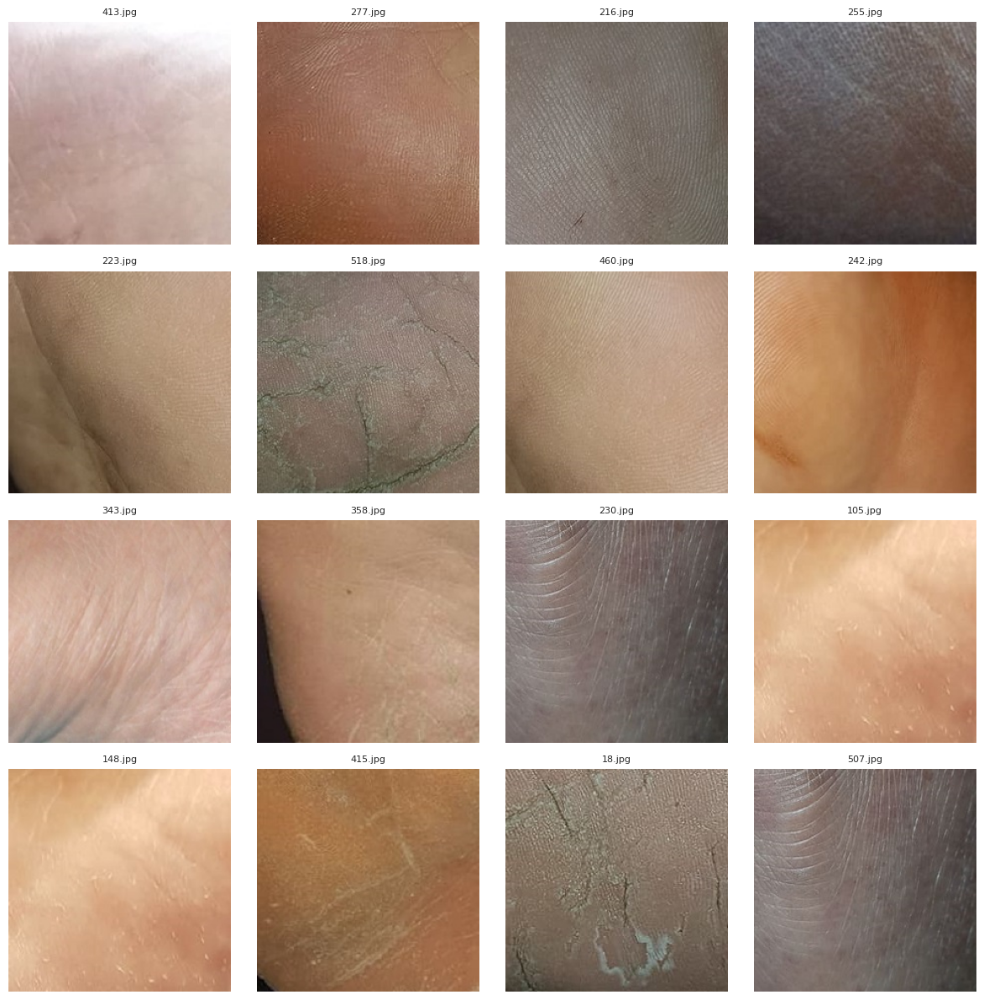

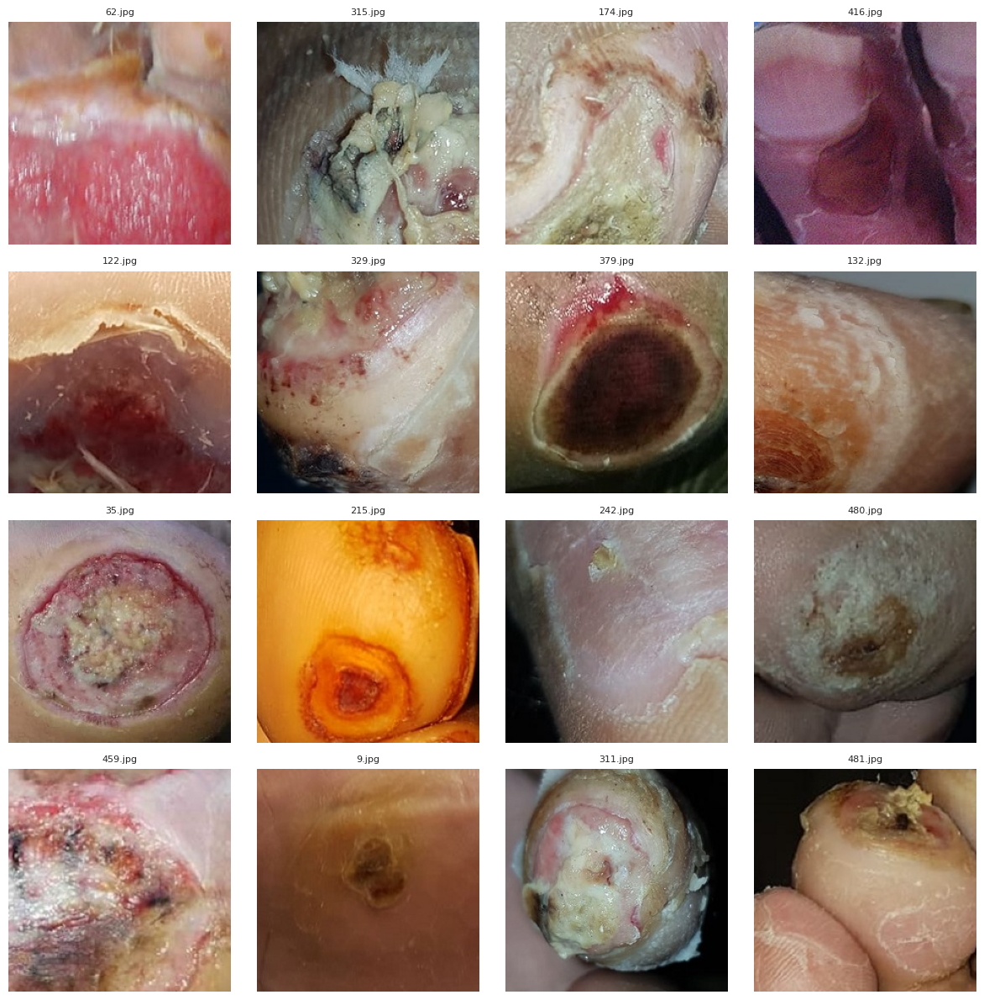

In [26]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Define the original dataset directory (update this path if needed)
original_dir = "/content/DFU/Patches"

# Function to visualize original images
def visualize_original_images(class_name, num_images=16):
    folder = os.path.join(original_dir, class_name)  # Use the defined `original_dir`

    # Get list of image files in the class folder
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Select random images
    sample_images = np.random.choice(files, size=min(num_images, len(files)), replace=False)

    # Plot images
    plt.figure(figsize=(12, 12))
    grid_size = int(np.ceil(np.sqrt(len(sample_images))))

    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(folder, img_file)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img) / 255.0  # Normalize

        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img_array)
        plt.axis('off')
        plt.title(f'{img_file}', fontsize=8)

    plt.tight_layout()
    plt.show()

# Example usage
visualize_original_images("Normal(Healthy skin)", num_images=16)
visualize_original_images("Abnormal(Ulcer)", num_images=16)

**2.Visualize Augmented Images**

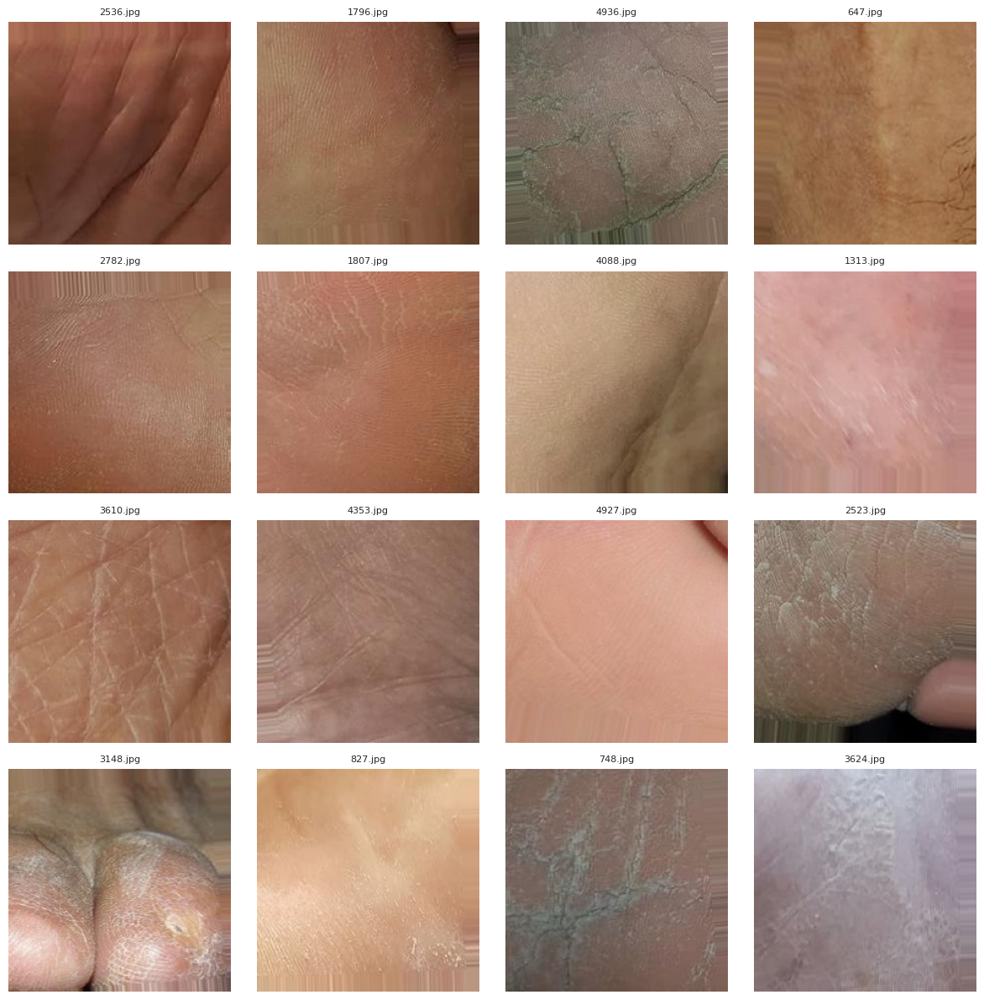

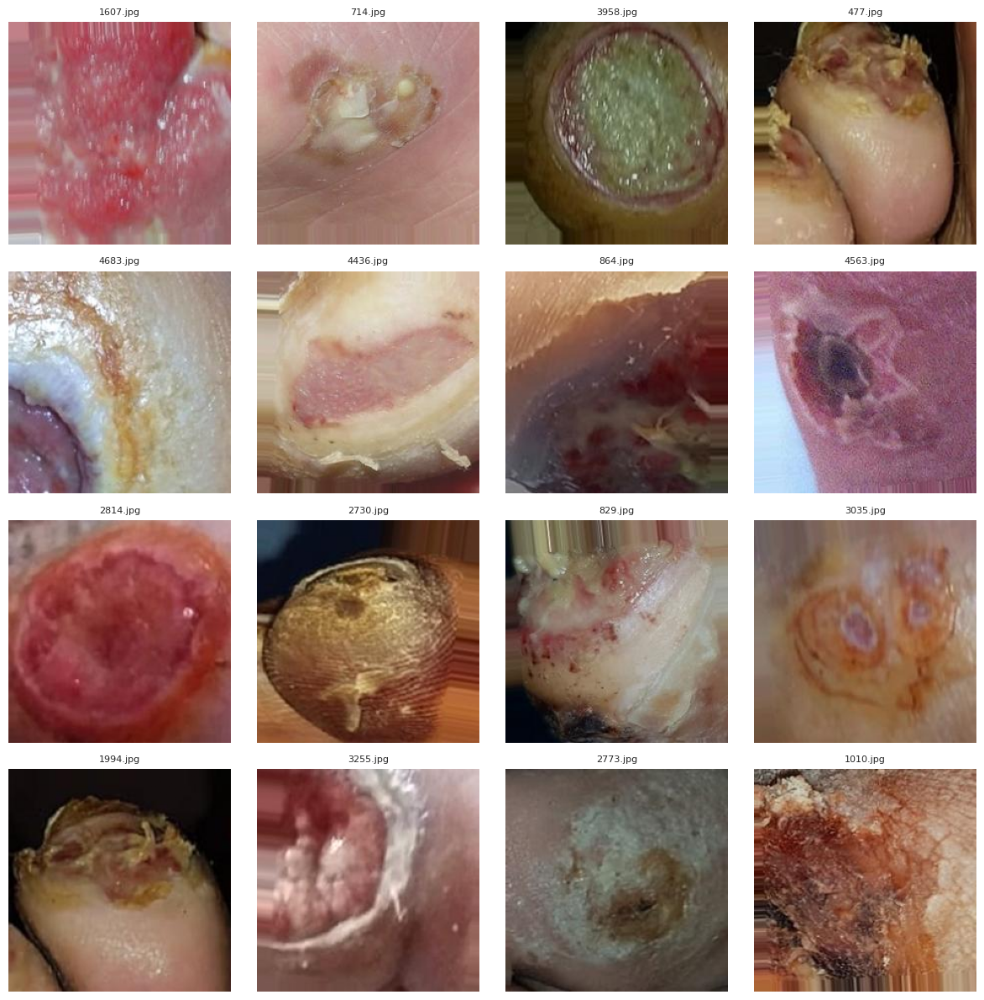

In [27]:
# Function to visualize augmented images
def visualize_augmented_images(class_name, augmented_dir, num_images=16):
    folder = os.path.join(augmented_dir, class_name)
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    sample_images = np.random.choice(files, size=min(num_images, len(files)), replace=False)

    plt.figure(figsize=(12, 12))
    grid_size = int(np.ceil(np.sqrt(len(sample_images))))

    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(folder, img_file)
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img) / 255.0
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(img_array)
        plt.axis('off')
        plt.title(f'{img_file}', fontsize=8)

    plt.tight_layout()
    plt.show()

# Example usage
visualize_augmented_images('Normal(Healthy skin)', augmented_dir='/content/DFU/AugmentedData', num_images=16)
visualize_augmented_images('Abnormal(Ulcer)', augmented_dir='/content/DFU/AugmentedData', num_images=16)

**3.Visualize Preprocessed Images (Canny Edge Detection and Histogram Equalization)**

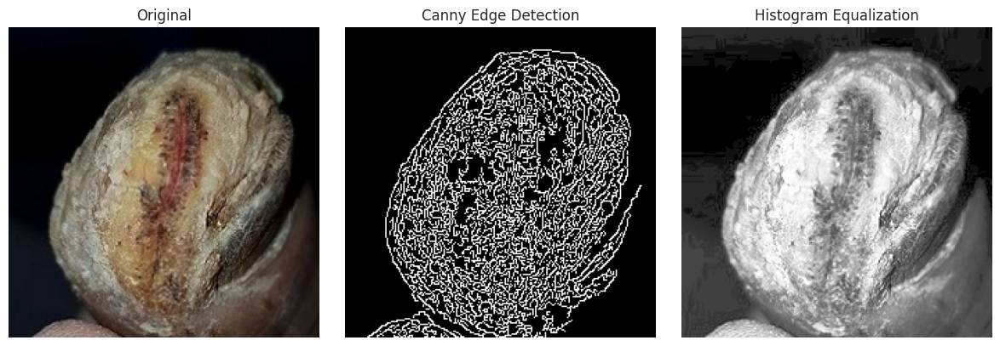

In [28]:
# Function to visualize preprocessed images
def visualize_preprocessing(filepath):
    img = cv2.imread(filepath, cv2.IMREAD_COLOR)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Canny Edge Detection
    canny = cv2.Canny(gray, 50, 150)

    # Histogram Equalization
    hist_eq = cv2.equalizeHist(gray)

    # Visualization
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(canny, cmap='gray')
    plt.title("Canny Edge Detection")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(hist_eq, cmap='gray')
    plt.title("Histogram Equalization")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
visualize_preprocessing('/content/DFU/Patches/Abnormal(Ulcer)/1.jpg')

**4. Plot Class Distribution**

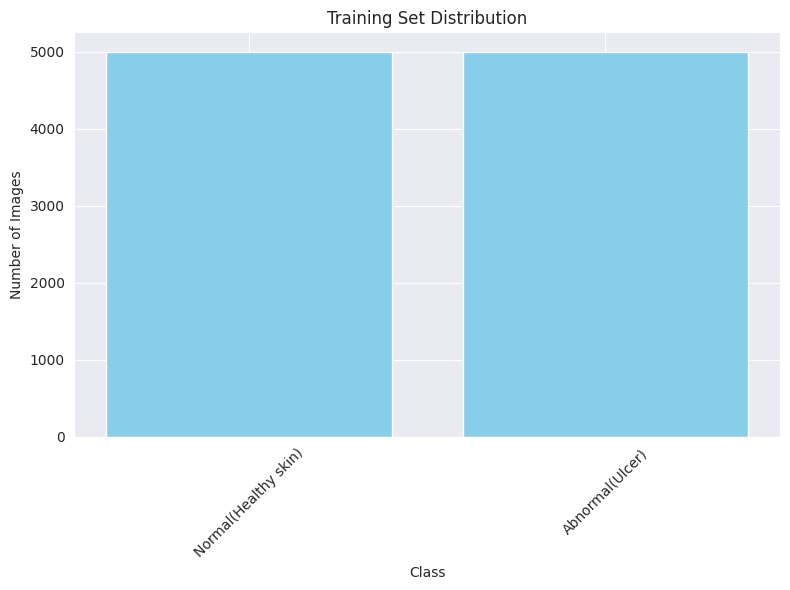

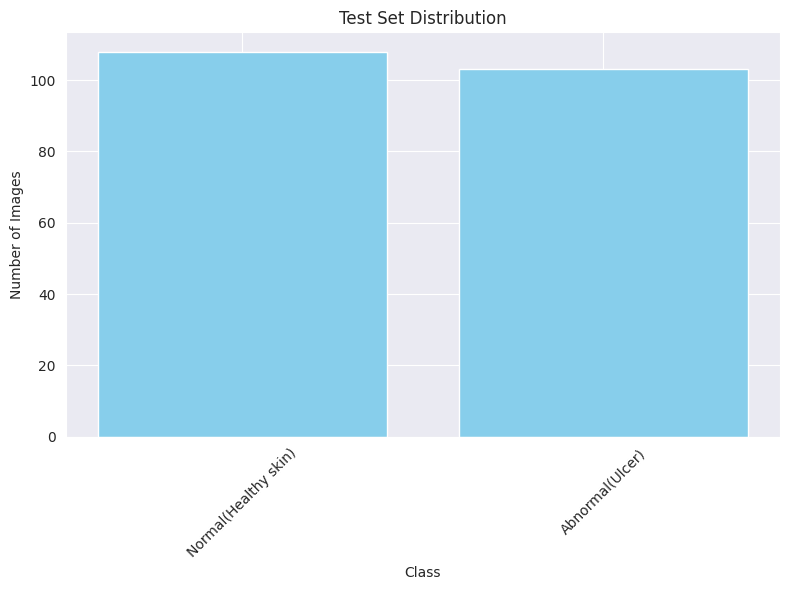

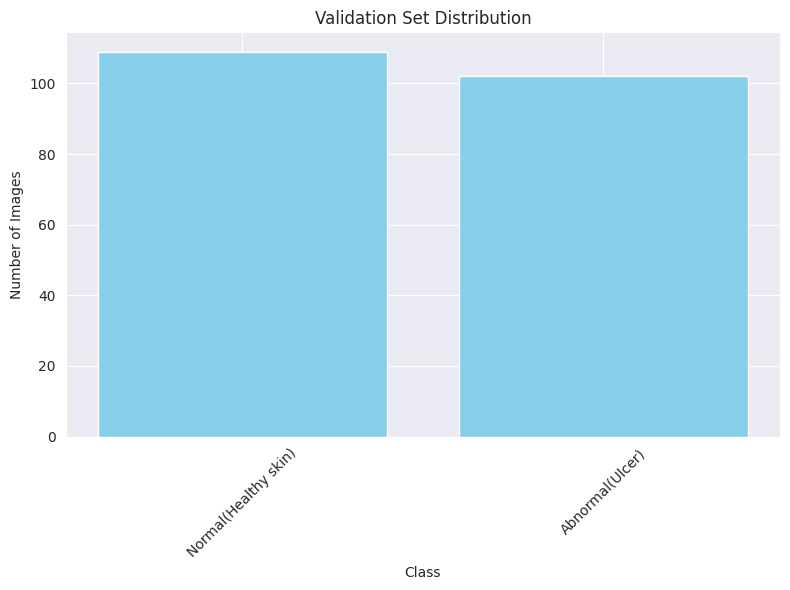

In [29]:
import matplotlib.pyplot as plt

# Function to plot class distribution
def plot_class_distribution(df, title="Class Distribution"):
    class_counts = df["class"].value_counts()  # Use "class" instead of "labels"

    plt.figure(figsize=(8, 6))
    plt.bar(class_counts.index, class_counts.values, color="skyblue")
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Example usage
plot_class_distribution(train_df, title="Training Set Distribution")
plot_class_distribution(test_df, title="Test Set Distribution")
plot_class_distribution(valid_df, title="Validation Set Distribution")


**5.Heatmap Pixel Intensity**

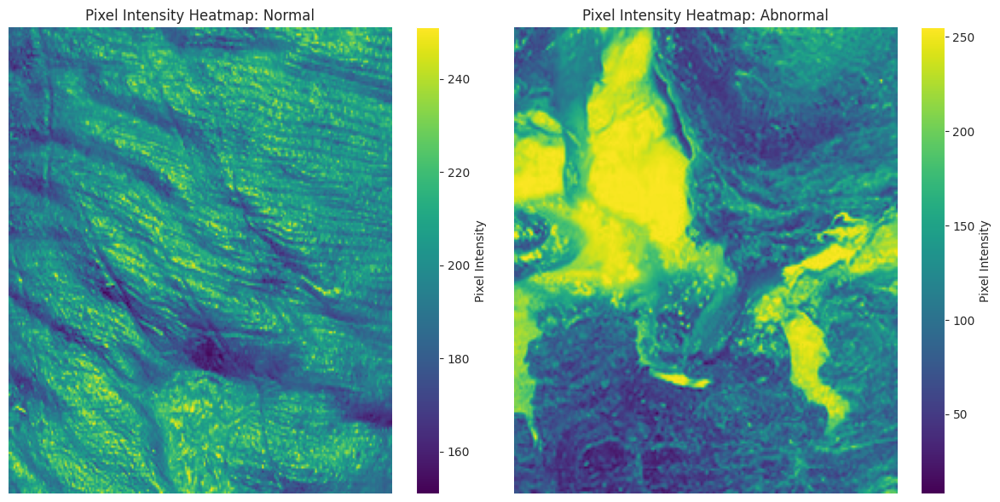

In [30]:
def visualize_heatmap_comparison(normal_image_path, abnormal_image_path, image_size=(224, 224)):
    """
    Compare pixel intensity heatmaps for a Normal image and an Abnormal image.

    Args:
        normal_image_path (str): Path to the Normal image.
        abnormal_image_path (str): Path to the Abnormal image.
        image_size (tuple): Target size for resizing images.
    """
    # Load Normal image
    normal_img = load_img(normal_image_path, target_size=image_size, color_mode='grayscale')
    normal_array = img_to_array(normal_img).squeeze()

    # Load Abnormal image
    abnormal_img = load_img(abnormal_image_path, target_size=image_size, color_mode='grayscale')
    abnormal_array = img_to_array(abnormal_img).squeeze()

    # Plot heatmaps side by side
    plt.figure(figsize=(12, 6))

    # Normal image heatmap
    plt.subplot(1, 2, 1)
    plt.imshow(normal_array, cmap='viridis', aspect='auto')
    plt.colorbar(label="Pixel Intensity")
    plt.title("Pixel Intensity Heatmap: Normal")
    plt.axis('off')

    # Abnormal image heatmap
    plt.subplot(1, 2, 2)
    plt.imshow(abnormal_array, cmap='viridis', aspect='auto')
    plt.colorbar(label="Pixel Intensity")
    plt.title("Pixel Intensity Heatmap: Abnormal")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    normal_image_path = '/content/DFU/Patches/Normal(Healthy skin)/14.jpg'  # Path to Normal image
    abnormal_image_path = '/content/DFU/Patches/Abnormal(Ulcer)/110.jpg'   # Path to Abnormal image

    visualize_heatmap_comparison(normal_image_path, abnormal_image_path)

**6.Pixel Intensity Histogram Comparison: Original vs Augmented**

Comparing Abnormal Images...


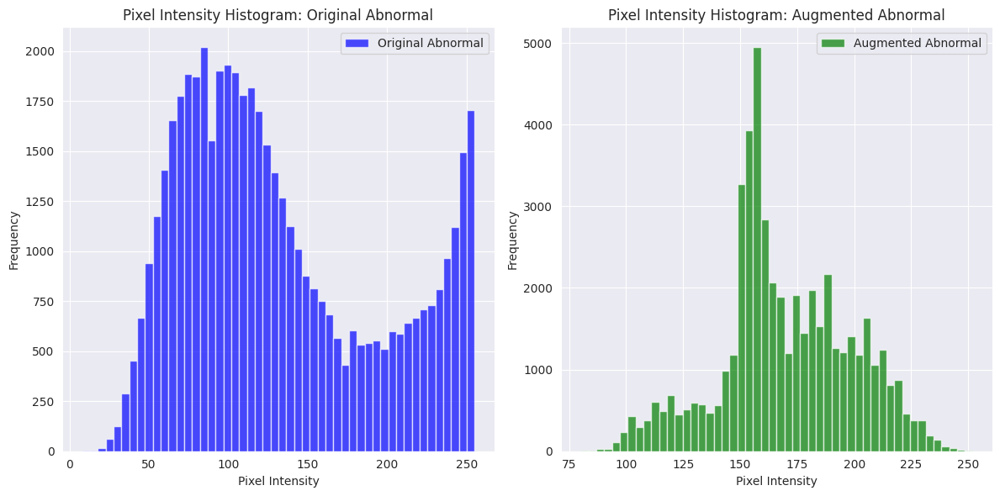

In [31]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def plot_histogram_comparison(original_image_path, augmented_image_path, title_original, title_augmented, image_size=(224, 224)):
    """
    Compare pixel intensity histograms for original and augmented abnormal images.

    Args:
        original_image_path (str): Path to the original abnormal image.
        augmented_image_path (str): Path to the augmented abnormal image.
        title_original (str): Title for the original image histogram.
        title_augmented (str): Title for the augmented image histogram.
        image_size (tuple): Target size for resizing images.
    """
    # Load Original Image
    original_img = load_img(original_image_path, target_size=image_size, color_mode='grayscale')
    original_array = img_to_array(original_img).squeeze().flatten()

    # Load Augmented Image
    augmented_img = load_img(augmented_image_path, target_size=image_size, color_mode='grayscale')
    augmented_array = img_to_array(augmented_img).squeeze().flatten()

    # Plot Histograms
    plt.figure(figsize=(12, 6))

    # Original Abnormal Image Histogram
    plt.subplot(1, 2, 1)
    plt.hist(original_array, bins=50, color='blue', alpha=0.7, label='Original Abnormal')
    plt.title(title_original)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

    # Augmented Abnormal Image Histogram
    plt.subplot(1, 2, 2)
    plt.hist(augmented_array, bins=50, color='green', alpha=0.7, label='Augmented Abnormal')
    plt.title(title_augmented)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    # Paths to original and augmented abnormal images
    original_abnormal_path = '/content/DFU/Patches/Abnormal(Ulcer)/110.jpg'
    augmented_abnormal_path = '/content/DFU/AugmentedData/Abnormal(Ulcer)/600.jpg'

    # Compare Abnormal images
    print("Comparing Abnormal Images...")
    plot_histogram_comparison(
        original_abnormal_path, augmented_abnormal_path,
        title_original="Pixel Intensity Histogram: Original Abnormal",
        title_augmented="Pixel Intensity Histogram: Augmented Abnormal"
    )

**7.Histogram Equalization**

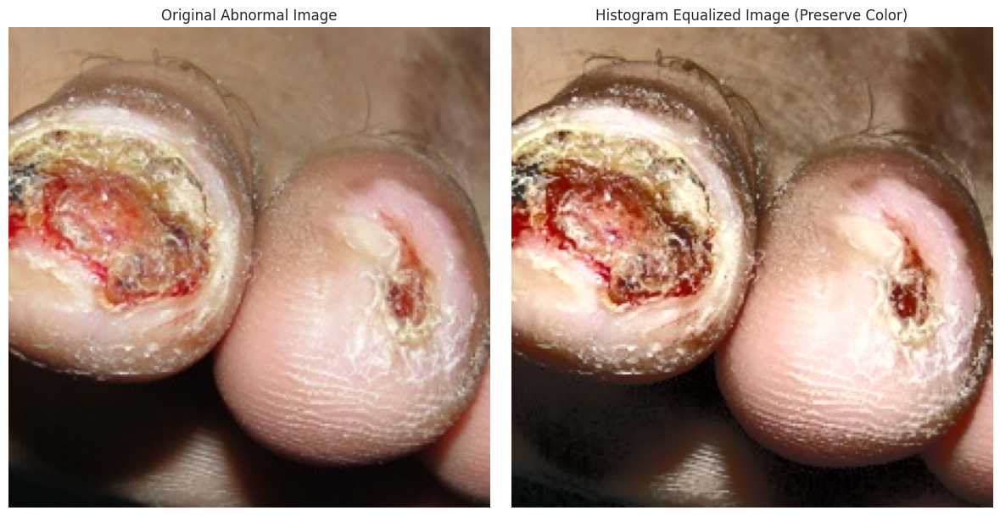

In [32]:
import cv2
import os
import matplotlib.pyplot as plt

def histogram_equalization_color(image_path):
    """
    Apply Histogram Equalization to the luminance channel of a color image in YCrCb space
    and display the original and equalized images side by side.

    Args:
        image_path (str): Path to the image file.
    """
    # Load the original image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Cannot read image at {image_path}")
        return

    # Convert the image to YCrCb color space
    img_ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)

    # Apply Histogram Equalization only on the Y channel (luminance)
    y_channel, cr_channel, cb_channel = cv2.split(img_ycrcb)
    y_equalized = cv2.equalizeHist(y_channel)
    img_ycrcb_equalized = cv2.merge((y_equalized, cr_channel, cb_channel))

    # Convert back to BGR color space
    img_equalized = cv2.cvtColor(img_ycrcb_equalized, cv2.COLOR_YCrCb2BGR)

    # Display the original and equalized images
    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Abnormal Image')
    plt.axis('off')

    # Equalized Image
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_equalized, cv2.COLOR_BGR2RGB))
    plt.title('Histogram Equalized Image (Preserve Color)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    image_path = '/content/DFU/Patches/Abnormal(Ulcer)/101.jpg'
    histogram_equalization_color(image_path)

**8.UMAP Visualization**

In [33]:
pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 5.5 MB/s eta 0:00:00


Loading data...
Applying UMAP...


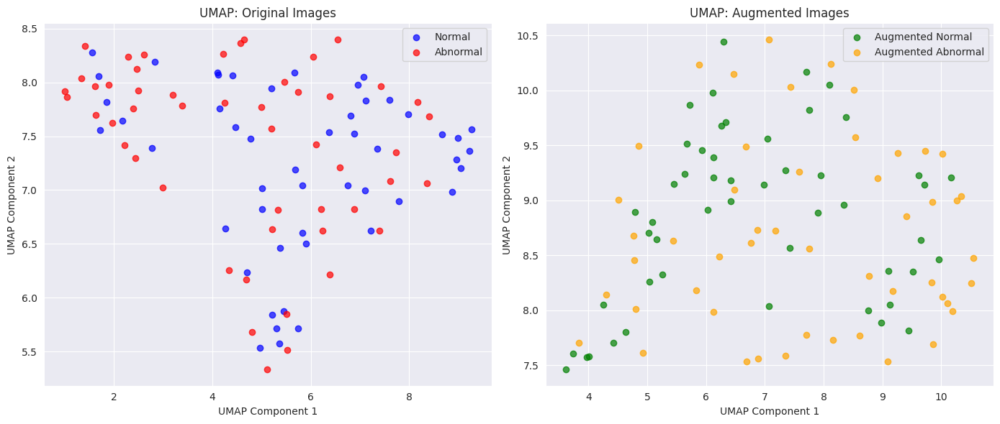

In [34]:
import os
import numpy as np
import matplotlib.pyplot as plt
import umap
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def load_images_from_folder(folder, num_images=50, image_size=(64, 64)):
    """
    Load images from a folder, resize them, and convert them to flattened vectors.

    Args:
        folder (str): Path to the image folder.
        num_images (int): Number of images to load.
        image_size (tuple): Target size for resizing images.

    Returns:
        np.array: Flattened image vectors.
    """
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    image_files = image_files[:num_images]

    image_data = []
    for file in image_files:
        img_path = os.path.join(folder, file)
        img = load_img(img_path, target_size=image_size, color_mode='grayscale')
        img_array = img_to_array(img).flatten()
        image_data.append(img_array)
    return np.array(image_data)

def visualize_umap(normal_folder, abnormal_folder, augmented_normal_folder, augmented_abnormal_folder, num_images=50, image_size=(64, 64)):
    """
    Visualize data using UMAP for both original and augmented datasets.

    Args:
        normal_folder (str): Path to original Normal images.
        abnormal_folder (str): Path to original Abnormal images.
        augmented_normal_folder (str): Path to augmented Normal images.
        augmented_abnormal_folder (str): Path to augmented Abnormal images.
        num_images (int): Number of images to process.
        image_size (tuple): Image resize dimensions.
    """
    # Load original and augmented data
    print("Loading data...")
    normal_data = load_images_from_folder(normal_folder, num_images, image_size)
    abnormal_data = load_images_from_folder(abnormal_folder, num_images, image_size)
    aug_normal_data = load_images_from_folder(augmented_normal_folder, num_images, image_size)
    aug_abnormal_data = load_images_from_folder(augmented_abnormal_folder, num_images, image_size)

    # Combine data and labels
    original_data = np.vstack((normal_data, abnormal_data))
    augmented_data = np.vstack((aug_normal_data, aug_abnormal_data))
    labels_original = ['Normal'] * num_images + ['Abnormal'] * num_images
    labels_augmented = ['Augmented Normal'] * num_images + ['Augmented Abnormal'] * num_images

    # Standardize data
    original_data = StandardScaler().fit_transform(original_data)
    augmented_data = StandardScaler().fit_transform(augmented_data)

    # Apply UMAP
    print("Applying UMAP...")
    umap_original = umap.UMAP(n_components=2, random_state=42).fit_transform(original_data)
    umap_augmented = umap.UMAP(n_components=2, random_state=42).fit_transform(augmented_data)

    # Plot UMAP Results
    plt.figure(figsize=(14, 6))

    # Original Data Visualization
    plt.subplot(1, 2, 1)
    for label, color in zip(['Normal', 'Abnormal'], ['blue', 'red']):
        indices = [i for i, lbl in enumerate(labels_original) if lbl == label]
        plt.scatter(umap_original[indices, 0], umap_original[indices, 1], label=label, alpha=0.7, c=color)
    plt.title('UMAP: Original Images')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.legend()

    # Augmented Data Visualization
    plt.subplot(1, 2, 2)
    for label, color in zip(['Augmented Normal', 'Augmented Abnormal'], ['green', 'orange']):
        indices = [i for i, lbl in enumerate(labels_augmented) if lbl == label]
        plt.scatter(umap_augmented[indices, 0], umap_augmented[indices, 1], label=label, alpha=0.7, c=color)
    plt.title('UMAP: Augmented Images')
    plt.xlabel('UMAP Component 1')
    plt.ylabel('UMAP Component 2')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    normal_folder = '/content/DFU/Patches/Normal(Healthy skin)'
    abnormal_folder = '/content/DFU/Patches/Abnormal(Ulcer)'
    augmented_normal_folder = '/content/DFU/AugmentedData/Normal(Healthy skin)'
    augmented_abnormal_folder = '/content/DFU/AugmentedData/Abnormal(Ulcer)'

    visualize_umap(normal_folder, abnormal_folder, augmented_normal_folder, augmented_abnormal_folder, num_images=50)

## Train Image Samples

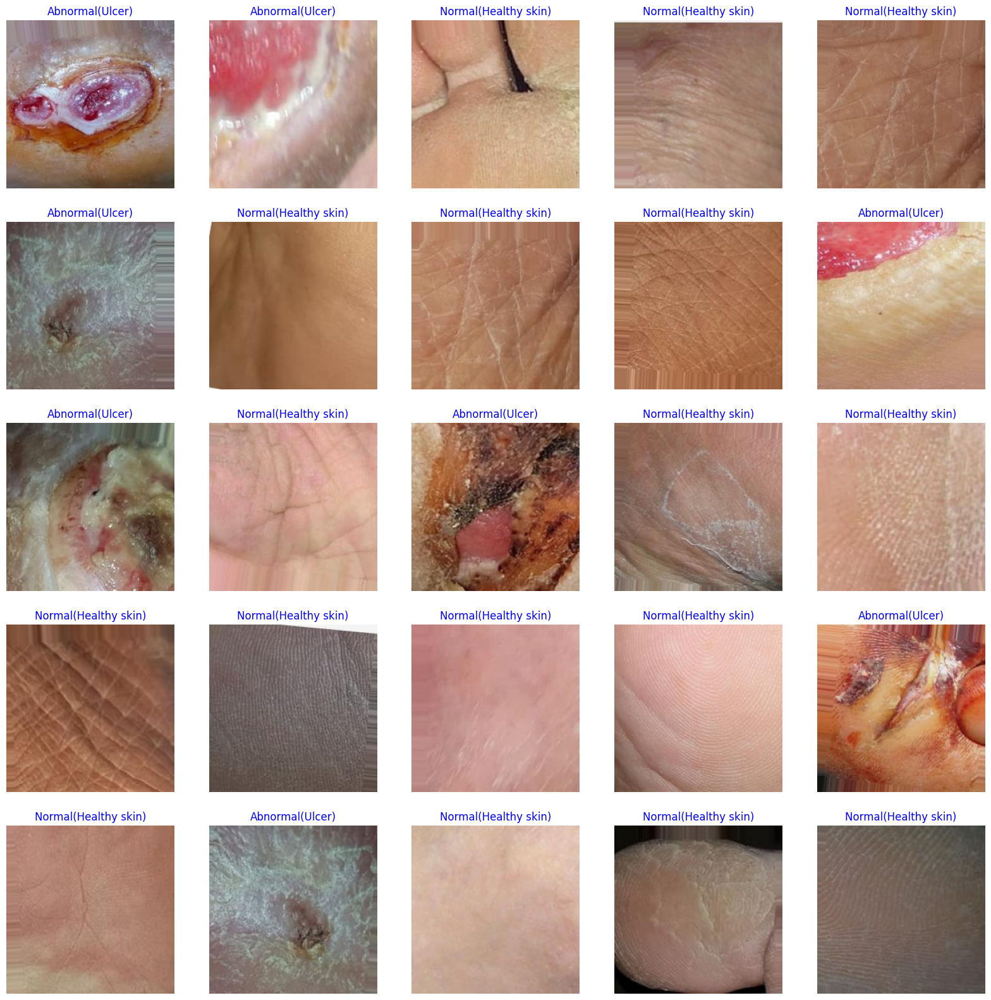

In [35]:
show_image_samples(train_gen)

# **MobileNet**

In [38]:
import tensorflow as tf
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras import Model, regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau, ModelCheckpoint, EarlyStopping
import numpy as np

# Define input shape and number of classes
img_shape = (224, 224, 3)  # Input image dimensions (height, width, channels)
class_count = 2  # Number of output classes (binary classification)

# Create the base model with NASNetMobile
base_model = NASNetMobile(
    include_top=False,       # Exclude the fully connected top layer to allow customization
    weights="imagenet",      # Use pre-trained weights from ImageNet
    input_shape=img_shape,   # Input shape for the model
    pooling=None             # No pooling layer, as we will add a custom pooling layer
)

# Freeze the base model layers to avoid training them initially
for layer in base_model.layers:
    layer.trainable = False  # Prevent updates to the pre-trained weights during the initial training phase

# Add custom layers on top of NASNetMobile
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Reduce spatial dimensions while keeping features
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)  # Normalize the activations
x = Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.002))(x)  # Fully connected layer with L2 regularization
x = BatchNormalization()(x)
x = Dropout(rate=0.5)(x)  # Dropout layer to reduce overfitting
x = Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.002))(x)  # Another fully connected layer with L2 regularization
x = BatchNormalization()(x)
x = Dropout(rate=0.5)(x)  # Dropout layer to reduce overfitting
output = Dense(class_count, activation='softmax')(x)  # Final output layer with softmax activation for binary classification

# Create the final model
model = Model(inputs=base_model.input, outputs=output)  # Combine the base model and custom layers

# Compile the model with Adam optimizer
model.compile(
    optimizer=Adam(learning_rate=5e-5),  # Optimizer with initial learning rate
    loss='categorical_crossentropy',      # Loss function for multi-class classification
    metrics=['accuracy']                  # Evaluation metric
)

print("NASNetMobile model created and compiled successfully.")

# Define callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1),
    ModelCheckpoint("best_model.keras", monitor='val_loss', save_best_only=True, verbose=1),
    EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
]

# Train model
history = model.fit(
    train_gen,
    epochs=10,
    validation_data=valid_gen,
    callbacks=callbacks,
    verbose=1
)

print("Initial training completed successfully.")

# Fine-tuning
for layer in base_model.layers[-10:]:
    layer.trainable = True

# Recompile with lower learning rate
model.compile(
    optimizer=Adam(learning_rate=5e-6),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Starting fine-tuning...")

# Fine-tune the model
history_finetune = model.fit(
    train_gen,
    epochs=5,
    validation_data=valid_gen,
    callbacks=callbacks,
    verbose=1
)

print("Fine-tuning completed successfully.")

19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
NASNetMobile model created and compiled successfully.
Epoch 1/10
333/334 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.6460 - loss: 2.8455
Epoch 1: val_loss improved from inf to 2.03453, saving model to best_model.keras
334/334 ━━━━━━━━━━━━━━━━━━━━ 98s 182ms/step - accuracy: 0.6465 - loss: 2.8438 - val_accuracy: 0.8863 - val_loss: 2.0345 - learning_rate: 5.0000e-05
Epoch 2/10
334/334 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8302 - loss: 2.1218
Epoch 2: val_loss improved from 2.03453 to 1.81331, saving model to best_model.keras
334/334 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - accuracy: 0.8302 - loss: 2.1216 - val_accuracy: 0.8957 - val_loss: 1.8133 - learning_rate: 5.0000e-05
Epoch 3/10
334/334 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.8649 - loss: 1.8970
Epoch 3: val_loss improved from 1.81331 to 1.69378, saving model to best_model.keras
334/334 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - accuracy: 0.8649 - loss: 1.8969 - val_accur

## Train Validation Graph

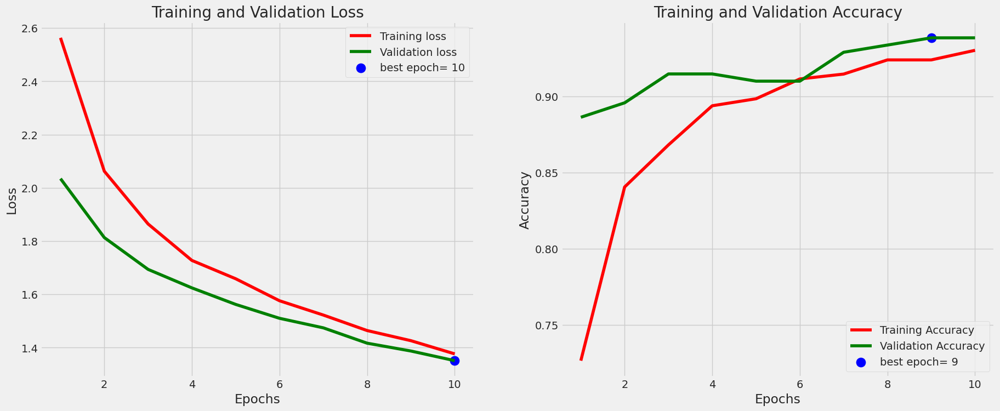

53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.9605 - loss: 1.2943
Accuracy on the test set: 94.31%



model was saved as /content/DFU/Models/ulcer_classification_NASNetMobile-ulcers-94.31.h5

class csv file was saved as /content/DFU/Models/class_dict.csv



In [40]:
# Plot training and validation loss
tr_plot(history, 0)  # Ensure `tr_plot` is defined

# Set parameters for evaluation and saving
subject = 'ulcers'

# Evaluate accuracy on the test set
# Ensure `test_gen` and `test_batch_size` are defined
acc = model.evaluate(test_gen, batch_size=test_batch_size, verbose=1, steps=len(test_gen), return_dict=False)[1] * 100

# Print the accuracy result in color
msg = f'Accuracy on the test set: {acc:.2f}%'
print_in_color(msg, (0, 255, 0), (55, 65, 80))  # Ensure `print_in_color` is defined

# Define parameters for saving the model and results
generator = train_gen  # Ensure `train_gen` is defined
save_path = '/content/DFU/Models'  # Replace with the actual path where you want to save the files
model_name = 'ulcer_classification_NASNetMobile'  # Adjust to your desired model name
img_size = img_shape  # Input image size, e.g., (224, 224)
scalar = 1  # Scale factor

# Call `saver` with the required arguments
model_save_loc, csv_save_loc = saver(
    save_path=save_path,             # Path to save the model and CSV
    model=model,                     # Model object to be saved
    model_name=model_name,           # Model name
    subject=subject,                 # Subject or description of the model
    accuracy=acc,                    # Accuracy of the model
    img_size=img_size,               # Image size
    scalar=scalar,                   # Scale factor
    generator=generator              # Data generator
)

# Optionally, save accuracy manually to CSV if needed
with open(csv_save_loc, 'a') as f:
    f.write(f"\nAccuracy: {acc:.2f}%")

##Classification Report

53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step


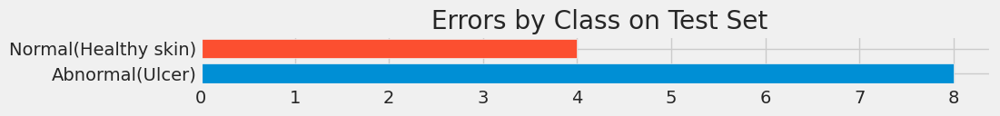

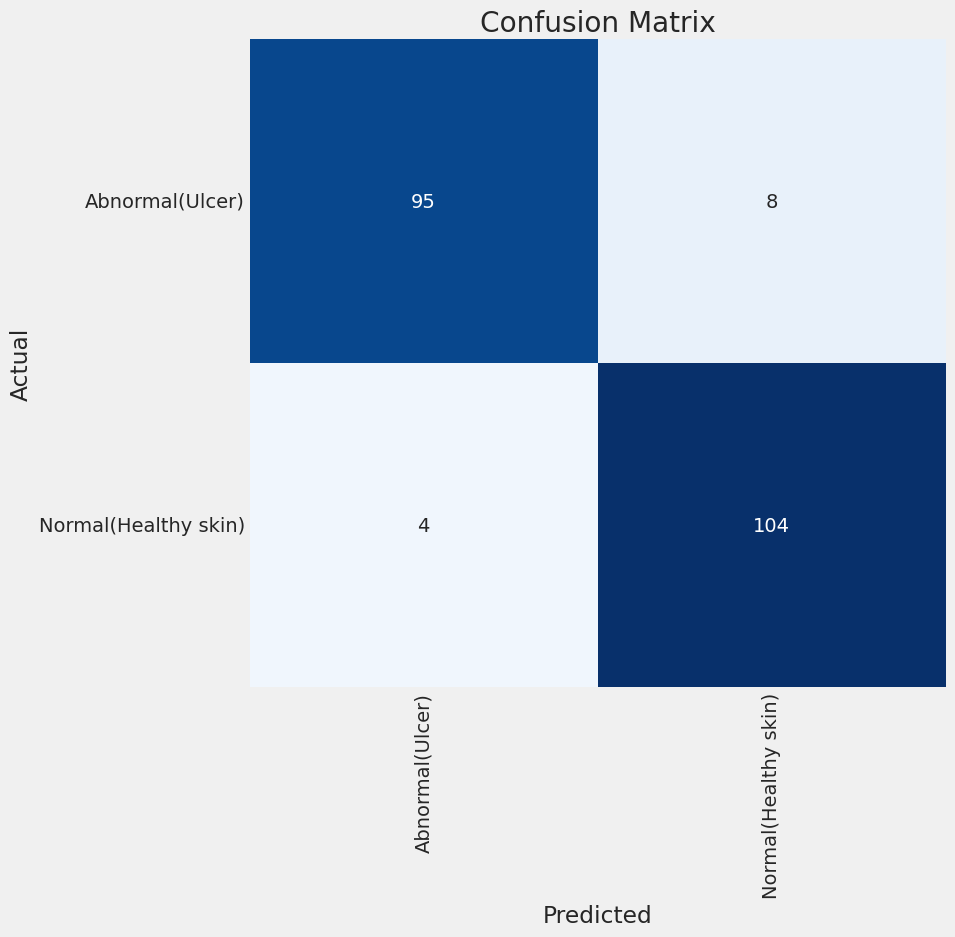

Classification Report:
----------------------
                       precision    recall  f1-score   support

     Abnormal(Ulcer)       0.96      0.92      0.94       103
Normal(Healthy skin)       0.93      0.96      0.95       108

            accuracy                           0.94       211
           macro avg       0.94      0.94      0.94       211
        weighted avg       0.94      0.94      0.94       211

True Positives (TP): 104
True Negatives (TN): 95
False Positives (FP): 8
False Negatives (FN): 4
Sensitivity (Recall): 0.9630
Specificity: 0.9223


In [42]:
# Define working directory for saving outputs
working_dir = '/content/DFU/Results'  # Set this to your desired output directory

# Make sure the directory exists
import os
os.makedirs(working_dir, exist_ok=True)

# Run predictions on the test set
print_code = 0  # Modify as needed if `print_code` controls output format
preds = model.predict(test_gen)  # Run predictions

# Generate and print classification report
# Ensure `print_info` is defined to accept these arguments
print_info(test_gen, preds, print_code, working_dir, subject)

# Assuming y_true (actual labels) and y_pred_labels (predicted class labels) are ready
y_true = test_gen.classes  # True labels from the test generator
y_pred_labels = np.argmax(preds, axis=1)  # Convert probabilities to class labels

# Calculate Confusion Matrix
tn, fp, fn, tp = confusion_matrix(y_true, y_pred_labels).ravel()

# Calculate Sensitivity (Recall) and Specificity
sensitivity = tp / (tp + fn)  # True Positive Rate
specificity = tn / (tn + fp)  # True Negative Rate

# Print the results
print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")

print(f"Sensitivity (Recall): {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")

In [43]:
from google.colab import files
files.download('/content/DFU/Models/ulcer_classification_NASNetMobile-ulcers-94.31.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Testing on a image

In [44]:
# Define a temporary storage path for image preprocessing
store_path = os.path.join(working_dir, 'storage')  # Temporary directory path for processed images
if os.path.isdir(store_path):
    shutil.rmtree(store_path)  # Remove the directory if it already exists
os.mkdir(store_path)  # Create a fresh directory

# Step 1: Load and preprocess the test image
# Specify the path to the test image
img_path = r'/content/DFU/Patches/Abnormal(Ulcer)/1.jpg'

# Load the image using OpenCV with reduced color depth for efficiency
img = cv2.imread(img_path, cv2.IMREAD_REDUCED_COLOR_2)

# Convert the image to RGB format as the model was trained on RGB images
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Extract the file name from the image path
file_name = os.path.split(img_path)[1]

# Save the processed image into the temporary directory
dst_path = os.path.join(store_path, file_name)
cv2.imwrite(dst_path, img)  # Save the RGB-converted image

# Step 2: Verify storage of the processed image
# Check if the directory was successfully created and the image was stored
print(os.listdir(store_path))  # List the contents of the temporary directory

['1.jpg']


 Model is being loaded- this will take about 10 seconds


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
 image is of class Abnormal(Ulcer) with a probability of  100.00 %



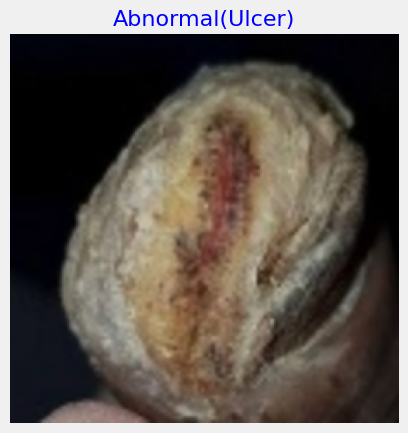

In [45]:
# Specify the paths to the required files
csv_path = csv_save_loc  # Path to the CSV file containing class mappings
model_path = model_save_loc  # Path to the saved trained model

# Step 1: Run the classifier
# Use the predictor function to classify the processed image
class_name, probability = predictor(store_path, csv_path, model_path, crop_image=False)

# Step 2: Display the prediction result
# Format the message with the class name and the probability
msg = f' image is of class {class_name} with a probability of {probability * 100: 6.2f} %'

# Print the result in color for better visualization
print_in_color(msg, (0, 255, 255), (65, 85, 55))

#                                                                         **END**